## Libraries

In [1]:
import os
import time
import warnings
from dotenv import load_dotenv

import pandas as pd
import numpy as np
import datetime as dt
from tqdm.notebook import tqdm
from typing import Dict, List, Tuple

import sklearn
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GroupKFold, StratifiedGroupKFold
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import (
    classification_report, precision_recall_fscore_support,
    accuracy_score, f1_score, matthews_corrcoef, 
    confusion_matrix, ConfusionMatrixDisplay
)

from feature_engine.datetime import DatetimeFeatures

import optuna
import lightgbm as lgb
import xgboost as xgb

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

## EDA

In [2]:
load_dotenv()
DATA_DIR = os.getenv("IMP_DATASET")

# Load the dataset
dataset = pd.read_csv(DATA_DIR)

# Remove the 'Unnamed: 0' column if it exists
if "Unnamed: 0" in dataset.columns:
    dataset.drop(columns=["Unnamed: 0"], inplace=True)
    
dataset.head(5)

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,timestamp,machine_status
0,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,2018-04-01 00:00:00,NORMAL
1,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,2018-04-01 00:01:00,NORMAL
2,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,...,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037,2018-04-01 00:02:00,NORMAL
3,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,...,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250,2018-04-01 00:03:00,NORMAL
4,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,...,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889,2018-04-01 00:04:00,NORMAL


In [3]:
has_nan_overall = dataset.isna().any().any()
has_nan_overall

np.False_

In [3]:
# Get all machine status labels
all_labels = ['BROKEN', 'NORMAL', 'RECOVERING']
all_labels

['BROKEN', 'NORMAL', 'RECOVERING']

In [4]:
# Generate encoding maps for labels
label2id = {l: i for i,l in enumerate(all_labels)}
id2label = {v:k for k,v in label2id.items()}
id2label

{0: 'BROKEN', 1: 'NORMAL', 2: 'RECOVERING'}

### View Distribution of Machine Status

C:\Users\yukse\AppData\Local\Temp\ipykernel_16488\1237394390.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(
C:\Users\yukse\AppData\Local\Temp\ipykernel_16488\1237394390.py:7: UserWarning: The palette list has more values (6) than needed (3), which may not be intended.
  bar_plot = sns.barplot(


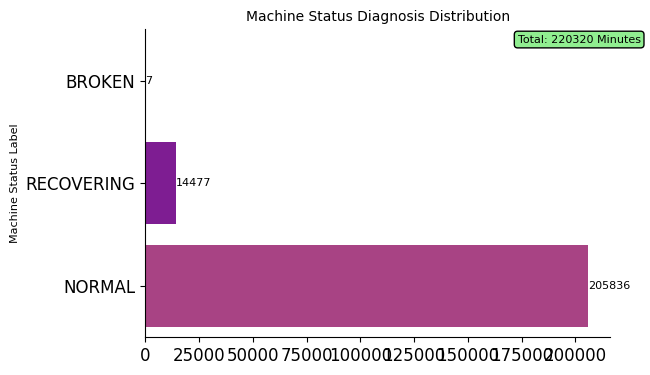

In [5]:
# View Diagnosis Distribution
fig = plt.figure(figsize=(6, 4))
plt.title('Machine Status Diagnosis Distribution', fontsize=10)

status_distribution = dataset['machine_status'].value_counts().sort_values()

bar_plot = sns.barplot(
    x=status_distribution.values,
    y=status_distribution.keys(),
    palette=sns.color_palette("plasma"),
    orient="h"
)

for container in bar_plot.containers:
    bar_plot.bar_label(container, fmt='%.0f', fontsize=8)
    
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylabel('Machine Status Label', fontsize=8)

text_params = {
    'x'       : status_distribution.max() * 0.98,
    'y'       : -0.4,
    's'       : f"Total: {len(dataset)} Minutes", 
    'size'    : 8,
    'color'   : "black",
    'ha'      : "center", 
    'va'      : "center",
    'bbox'    : dict(boxstyle="round", fc=("lightgreen"),ec=("black"))
}
plt.text(**text_params)
plt.grid(False)
sns.despine()

In [6]:
print("--- Before Conversion ---")
print(dataset['machine_status'].value_counts())
dataset.loc[dataset['machine_status'] == 'BROKEN', 'machine_status'] = 'RECOVERING'
print("\n\n--- After Conversion ---")
print(dataset['machine_status'].value_counts())

--- Before Conversion ---
machine_status
NORMAL        205836
RECOVERING     14477
BROKEN             7
Name: count, dtype: int64


--- After Conversion ---
machine_status
NORMAL        205836
RECOVERING     14484
Name: count, dtype: int64


In [7]:
# Encode categorical variables
label_encoder = LabelEncoder()

dataset['target'] = label_encoder.fit_transform(dataset['machine_status'])

dataset.head(5)

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,timestamp,machine_status,target
0,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,2018-04-01 00:00:00,NORMAL,0
1,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,2018-04-01 00:01:00,NORMAL,0
2,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,...,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037,2018-04-01 00:02:00,NORMAL,0
3,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,...,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250,2018-04-01 00:03:00,NORMAL,0
4,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,...,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889,2018-04-01 00:04:00,NORMAL,0


In [10]:
label_encoder.classes_

array(['NORMAL', 'RECOVERING'], dtype=object)

### Generate DateTime Features

In [8]:
def apply_datetime_features(dataframe, variable_name="Date"):

    dtfs = DatetimeFeatures(
        variables=variable_name,
        features_to_extract=["day_of_year", "month", "hour"],
        drop_original=False
    )

    dfs_transformed = dtfs.fit_transform(dataframe)

    return dfs_transformed

In [9]:
# Apply datetime features
dataset_transformed = apply_datetime_features(dataset, variable_name="timestamp")
dataset_transformed.head(5)

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_48,sensor_49,sensor_50,sensor_51,timestamp,machine_status,target,timestamp_day_of_year,timestamp_month,timestamp_hour
0,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,157.9861,67.70834,243.0556,201.3889,2018-04-01 00:00:00,NORMAL,0,91,4,0
1,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,157.9861,67.70834,243.0556,201.3889,2018-04-01 00:01:00,NORMAL,0,91,4,0
2,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,...,155.9606,67.12963,241.3194,203.7037,2018-04-01 00:02:00,NORMAL,0,91,4,0
3,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,...,155.9606,66.84028,240.4514,203.1250,2018-04-01 00:03:00,NORMAL,0,91,4,0
4,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,...,158.2755,66.55093,242.1875,201.3889,2018-04-01 00:04:00,NORMAL,0,91,4,0


### Assign System Failures To Groups

In [10]:
group_idx = 0
anomaly_group = [0]
target_series = dataset_transformed['machine_status'].to_list()

# Generate groups for each anomaly case
for _ in range(1, len(dataset_transformed)):
    if (target_series[_] == 'NORMAL' and target_series[_ - 1] == 'RECOVERING'):
        group_idx += 1
        
    anomaly_group.append(group_idx)

# Add groups to dataset
dataset_transformed['anomaly_group'] = np.array(anomaly_group).astype(np.int32)
dataset_transformed['anomaly_group']

0         0
1         0
2         0
3         0
4         0
         ..
220315    7
220316    7
220317    7
220318    7
220319    7
Name: anomaly_group, Length: 220320, dtype: int32

In [11]:
groups = list(set(dataset_transformed['anomaly_group']))
group_dict = {}

# Get system failure instance label counts
for _ in groups:
    group_dict[_] = dict(
        dataset_transformed[dataset_transformed['anomaly_group'] == _]
        ['machine_status']
        .value_counts()
    )
# Create summary df for system failure counts    
group_df = pd.DataFrame(group_dict).T.fillna(0).astype(np.int32)
group_df

,NORMAL,RECOVERING
0,17155,945
1,6410,3111
2,41697,1313
3,7159,606
4,49644,8391
5,4700,42
6,25267,76
7,53804,0


### Data Preprocessing

In [12]:
# Initialise lag feature variables
lag_features = []
n_lags = 10
feaures_added = False

In [13]:
# Define list of sensors
ignored_columns = [
    'timestamp', 'machine_status', 'target', 'timestamp_day_of_year', 'timestamp_month', 'timestamp_hour', 'anomaly_group'
]
sensors = [_ for _ in dataset_transformed.columns if _ not in ignored_columns]

if not (feaures_added):
    for lag in range(n_lags):
        lag_sensors = {}

        for sensor in sensors:
            # Create lag feature name
            sensor_feature = sensor + f'_lag_{n_lags}'
            
            # Generate lag feature
            dataset_transformed[sensor_feature] = dataset_transformed[sensor].shift(n_lags)
                
    # Set flag to True to avoid adding duplications
    feaures_added = True
else:
    print('Features have already been added!')

In [28]:
dataset_transformed.head(20)

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_42_lag_10,sensor_43_lag_10,sensor_44_lag_10,sensor_45_lag_10,sensor_46_lag_10,sensor_47_lag_10,sensor_48_lag_10,sensor_49_lag_10,sensor_50_lag_10,sensor_51_lag_10
0,2.465394,47.09201,53.21180,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2.465394,47.09201,53.21180,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2.444734,47.35243,53.21180,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2.460474,47.09201,53.16840,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2.445718,47.13541,53.21180,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2.453588,47.09201,53.16840,46.397568,637.6157,78.18568,13.41146,16.16753,15.89265,15.16204,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2.455556,47.04861,53.16840,46.397568,633.3333,75.81614,13.43316,16.13136,15.65393,15.08247,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2.449653,47.13541,53.16840,46.397568,630.6713,75.77331,13.25231,16.12413,16.19647,15.08247,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2.463426,47.09201,53.16840,46.397568,631.9444,74.58916,13.28848,16.13136,15.47309,15.11863,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2.445718,47.17882,53.16840,46.397568,641.7823,74.57428,13.38252,16.24711,15.61777,15.11863,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
dataset_transformed = dataset_transformed.dropna().reset_index(drop=True)
dataset_transformed.head(10)

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_42_lag_10,sensor_43_lag_10,sensor_44_lag_10,sensor_45_lag_10,sensor_46_lag_10,sensor_47_lag_10,sensor_48_lag_10,sensor_49_lag_10,sensor_50_lag_10,sensor_51_lag_10
0,2.464410,47.48264,53.12500,46.397568,637.7314,76.05148,13.41146,16.16753,15.65393,15.11863,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889
1,2.444734,47.91666,53.16840,46.397568,635.6482,74.58654,13.41146,16.16753,15.84925,15.11863,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889
2,2.460474,48.26389,53.12500,46.397568,630.0926,76.95988,13.34635,16.16753,15.73351,15.01013,...,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037
3,2.448669,48.43750,53.16840,46.397568,638.6574,75.67310,13.31742,16.16753,15.84925,15.16927,...,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250
4,2.453588,48.56771,53.16840,46.397568,632.4074,80.65949,13.38976,16.13136,15.53096,15.08970,...,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889
5,2.455556,48.39410,53.12500,46.397570,642.3611,78.13193,13.35359,16.21094,15.45139,15.12587,...,31.250000,42.70833,38.773150,63.65741,51.79398,38.773150,164.6412,66.55093,241.6088,201.6782
6,2.449653,48.39410,53.16840,46.310760,630.2084,77.89381,13.30295,16.16753,15.89265,15.08247,...,31.510420,43.22916,38.194440,61.92130,51.79398,39.062500,171.8750,67.70834,240.1620,200.2315
7,2.463426,48.48090,53.68924,46.310760,643.6343,77.30572,13.34635,16.16753,15.61777,15.01013,...,31.510416,42.96875,38.194443,59.60648,50.92593,39.351850,178.5301,68.57639,241.3194,201.0995
8,2.445718,48.61111,53.12500,46.310760,632.9861,76.66199,13.34635,16.21094,15.81308,15.05353,...,31.510416,42.18750,38.194440,57.87037,50.63657,39.351850,182.0023,69.44444,243.0556,201.6782
9,2.464410,48.61111,53.16840,46.310760,644.3287,78.49116,13.34635,16.13136,15.70457,15.08247,...,31.510416,41.66666,39.062500,56.42361,50.63657,39.062500,186.6319,69.73380,246.5278,200.8102


In [15]:
# Generate Train & Test splits based on assigned groups
train_df = dataset_transformed[
    ~dataset_transformed['anomaly_group'].isin([5, 6, 7])
]

test_df = dataset_transformed[
    dataset_transformed['anomaly_group'].isin([5, 6, 7])
].reset_index(drop=True)

# View train data
train_df.head(10)

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_42_lag_10,sensor_43_lag_10,sensor_44_lag_10,sensor_45_lag_10,sensor_46_lag_10,sensor_47_lag_10,sensor_48_lag_10,sensor_49_lag_10,sensor_50_lag_10,sensor_51_lag_10
0,2.464410,47.48264,53.12500,46.397568,637.7314,76.05148,13.41146,16.16753,15.65393,15.11863,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889
1,2.444734,47.91666,53.16840,46.397568,635.6482,74.58654,13.41146,16.16753,15.84925,15.11863,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889
2,2.460474,48.26389,53.12500,46.397568,630.0926,76.95988,13.34635,16.16753,15.73351,15.01013,...,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037
3,2.448669,48.43750,53.16840,46.397568,638.6574,75.67310,13.31742,16.16753,15.84925,15.16927,...,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250
4,2.453588,48.56771,53.16840,46.397568,632.4074,80.65949,13.38976,16.13136,15.53096,15.08970,...,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889
5,2.455556,48.39410,53.12500,46.397570,642.3611,78.13193,13.35359,16.21094,15.45139,15.12587,...,31.250000,42.70833,38.773150,63.65741,51.79398,38.773150,164.6412,66.55093,241.6088,201.6782
6,2.449653,48.39410,53.16840,46.310760,630.2084,77.89381,13.30295,16.16753,15.89265,15.08247,...,31.510420,43.22916,38.194440,61.92130,51.79398,39.062500,171.8750,67.70834,240.1620,200.2315
7,2.463426,48.48090,53.68924,46.310760,643.6343,77.30572,13.34635,16.16753,15.61777,15.01013,...,31.510416,42.96875,38.194443,59.60648,50.92593,39.351850,178.5301,68.57639,241.3194,201.0995
8,2.445718,48.61111,53.12500,46.310760,632.9861,76.66199,13.34635,16.21094,15.81308,15.05353,...,31.510416,42.18750,38.194440,57.87037,50.63657,39.351850,182.0023,69.44444,243.0556,201.6782
9,2.464410,48.61111,53.16840,46.310760,644.3287,78.49116,13.34635,16.13136,15.70457,15.08247,...,31.510416,41.66666,39.062500,56.42361,50.63657,39.062500,186.6319,69.73380,246.5278,200.8102


In [31]:
# Drop unnecessary columns
train_df.drop(columns=['anomaly_group'], inplace=True)
test_df.drop(columns=['anomaly_group'], inplace=True)

C:\Users\yukse\AppData\Local\Temp\ipykernel_5564\714826828.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df.drop(columns=['anomaly_group'], inplace=True)


### View Train/Test Split Machine Status Time Plot

In [16]:
date_column = 'timestamp'
target_column = 'target'

def plot_target(df, target_col=target_column, set_name='Train'):
    # Define plot figure
    fig = plt.figure(figsize=(10, 4))

    # Get group sensor max & min readings
    y_min = 0
    y_max = 1

    # Plot shaded area for NORMAL machine status
    plt.fill_between(
        df[date_column], y_min, y_max, where=(df[target_col]==0), 
        color='lightgreen', alpha=0.3, interpolate=True, label=id2label[0]
    )

    # Plot shaded area for BROKEN machine status
    plt.fill_between(
        df[date_column], y_min, y_max, where=(df[target_col]==1), 
        color='orange', alpha=0.9, interpolate=True, label=id2label[1]
    )

    # Plot shaded area for RECOVERING machine status
    plt.fill_between(
        df[date_column], y_min, y_max, where=(df[target_col]==2), 
        color='red', alpha=0.3, interpolate=True, label=id2label[2]
    )

    # Finish subplot setup
    plt.xlabel('Date', fontsize=8)
    plt.ylabel('', fontsize=6)
    plt.title(
        f'{set_name} Machine Status Time Plot', 
        fontsize=8, pad=20
    )

    # Show Legend 
    plt.legend(fontsize=8)
    plt.grid(False)

    sns.despine()
    plt.show()

    return

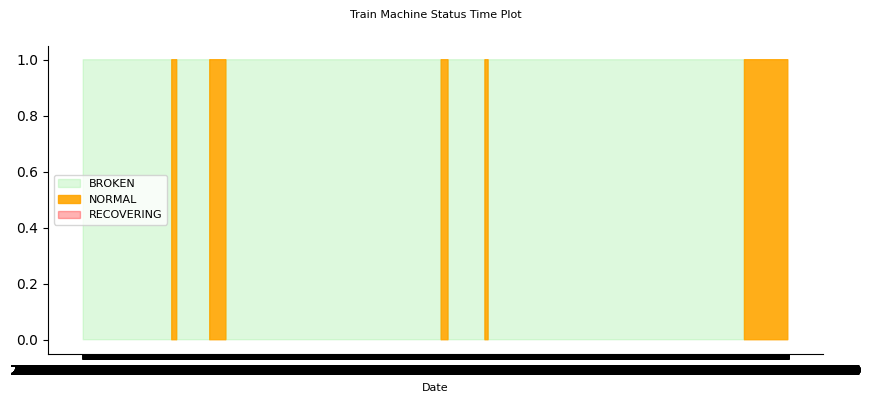

KeyboardInterrupt: 

In [17]:
# Plot train machine status time plot
plot_target(train_df, target_col=target_column, set_name='Train')

# Plot test machine status time plot
plot_target(test_df, target_col=target_column, set_name='Test')

### Cross-Validation

In [17]:
time_features = [
    'timestamp_day_of_year', 
    'timestamp_month', 
    'timestamp_hour'
]
# Define input features for training
selected_features = [
    *time_features, 
    *sensors, 
    *lag_features
]

In [18]:
def generate_model(xgb_params, lgbm_params):
        xgb_model = xgb.XGBClassifier(**xgb_params)
        lgbm_model = lgb.LGBMClassifier(**lgbm_params)
        
        ensemble_models = [
            ('XGB', xgb_model),
            ('LGBM', lgbm_model),
        ]
        
        return ensemble_models
    
def generate_voting_classifier(models):
    voting_params = {
        'estimators' : models,
        'n_jobs'     : 1,
        'weights'    : [0.5, 0.5],
        'voting'     : 'soft',
    }

    return VotingClassifier(**voting_params)

In [28]:
def fit_cv(
    model_constructor, model_params,
    cv_folds, dataset_transformed,
    features, target, metric_fn, 
    metric_name='f1_score',
    model_name='XGBoost'):

    # Create session dict
    session = {
        'scores'         : [],
        'predictions'    : [],
        'models'         : [],
        'name'           : model_name
    }

    feature_data = dataset_transformed[features]
    target_data = dataset_transformed[target]
    groups = dataset_transformed['anomaly_group']
    pbar = tqdm(total=5)

    # Train models on folds
    print(f'Training {model_name} Models')
    for fold, (train_idx, val_idx) in enumerate(
        cv_folds.split(feature_data, target_data, groups=groups)):
        
        print('----------------------------------')
        print(f"Training on Fold {fold + 1} ... \n")

        # Get Fold Training and Validation Split Data
        X_train, X_val = feature_data.iloc[train_idx], feature_data.iloc[val_idx]
        y_train, y_val = target_data[train_idx], target_data[val_idx]

        # Generate model
        if model_name == 'Voting':
            voting_models = generate_model(
                model_params['xgb_params'], 
                model_params['lgbm_params']
            )
            model = model_constructor(voting_models)
        else:
            model = model_constructor(**model_params)

        # Fit the model
        fit_params = {
            'X': X_train,
            'y': y_train.to_numpy(),
        }
        
        if model_name == 'XGBoost':
            fit_params['eval_set'] = [(X_train, y_train), (X_val, y_val)]
            fit_params['early_stopping_rounds'] = 100
            fit_params['verbose'] = 0

        if model_name == 'LightGBM':
            fit_params['eval_set'] = (X_val, y_val)
            fit_params['callbacks'] = [
                lgb.early_stopping(stopping_rounds=100, verbose=0),
            ]

        if model_name == 'CatBoost':
            fit_params['eval_set'] = [(X_train, y_train), (X_val, y_val)]
            fit_params['early_stopping_rounds'] = 100
            fit_params['verbose'] = 0

        start = time.perf_counter()
        model.fit(**fit_params)
        end = time.perf_counter()

        # Compute total training time
        total_training_time = end - start

        # Generate & Record Metric
        val_predictions = model.predict(X_val.to_numpy())
        val_score = metric_fn(y_val, val_predictions)
        session['scores'].append(val_score)

        # Print Training Time & Metric
        print(f'Time: {total_training_time:.2f}s\t| {metric_name}: {val_score:.4f}')

        # Record Model
        session['models'].append(model)

        pbar.update()

    # Print OOF Metric score
    print('==================================')
    print(f"\nOOF {metric_name}:\t\t{np.mean(session['scores']):.4f}")
    print('==================================')

    return session

### Hyperparameter Tuning

In [25]:
def fn_metric(y_true, y_pred):
    return f1_score(y_true, y_pred, average='macro')

# Define XGBoost hyperparameter tuning
def xgb_objective(trial):
    params = {
        'n_estimators'             : trial.suggest_int('n_estimators', 256, 10192),
        'max_depth'                : trial.suggest_int('max_depth', 3, 15),
        'learning_rate'            : trial.suggest_float('learning_rate', 0.0001, 0.01),
        'reg_lambda'               : trial.suggest_float('reg_lambda', 0.001, 1.5),
        'reg_alpha'                : trial.suggest_float('reg_alpha', 0.001, 1.5),
        'gamma'                    : trial.suggest_float('gamma', 0.001, 1.5),
        'random_state'             : 42,
        'objective'                : 'binary:logistic',
        'eval_metric'              : 'mlogloss',
        'tree_method'              : 'hist',
        'device'                   : 'cuda'
    }
    
    # Fit the model
    optuna_model = xgb.XGBClassifier(**params)
    optuna_model.fit(
        train_df[selected_features], 
        train_df[target_column]
    )

    # Make predictions
    y_pred = optuna_model.predict(test_df[selected_features])

    # Evaluate predictions
    metric = fn_metric(test_df[target_column], y_pred)
    return metric

xgb_study = optuna.create_study(direction='maximize')
xgb_study.optimize(xgb_objective, n_trials=350, show_progress_bar=True)

print("Hyperparameter tuning complete.")
print(f"Best trial F1-score: {xgb_study.best_value:.4f}")
print("Best parameters found:")
print(xgb_study.best_params)

[I 2025-06-18 09:11:49,186] A new study created in memory with name: no-name-a5fb4423-90ee-41f3-8e6b-9ba01185e53a


  0%|          | 0/350 [00:00<?, ?it/s]

c:\Users\yukse\Desktop\Yuksel\Yucas\NLP\Lib\site-packages\xgboost\core.py:729: UserWarning: [09:12:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\common\error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  return func(**kwargs)


[I 2025-06-18 09:12:01,332] Trial 0 finished with value: 0.723202732856679 and parameters: {'n_estimators': 7033, 'max_depth': 8, 'learning_rate': 0.005580666944342469, 'reg_lambda': 0.8904572328208042, 'reg_alpha': 0.22310578513635848, 'gamma': 1.2635297830018672}. Best is trial 0 with value: 0.723202732856679.
[I 2025-06-18 09:12:12,687] Trial 1 finished with value: 0.7119363766931583 and parameters: {'n_estimators': 3985, 'max_depth': 7, 'learning_rate': 0.003505926776578892, 'reg_lambda': 0.7698559366049267, 'reg_alpha': 0.25786043201697423, 'gamma': 0.8063347008629268}. Best is trial 0 with value: 0.723202732856679.
[I 2025-06-18 09:12:22,774] Trial 2 finished with value: 0.7011092672078816 and parameters: {'n_estimators': 3723, 'max_depth': 6, 'learning_rate': 0.004080336462382685, 'reg_lambda': 1.277892492594404, 'reg_alpha': 0.816562432224907, 'gamma': 0.4346331982727503}. Best is trial 0 with value: 0.723202732856679.
[I 2025-06-18 09:12:31,907] Trial 3 finished with value: 0.

In [26]:
def fn_metric(y_true, y_pred):
    return f1_score(y_true, y_pred, average='macro')

# Define LightGBM hyperparameter tuning
def lgbm_objective(trial):
    """Optuna objective function for LightGBM."""
    params = {
        'objective': 'multiclass',
        'metric': 'multi_logloss',
        'random_state': 42,
        'force_col_wise': True,
        'is_unbalance': True,
        'n_estimators': trial.suggest_int('n_estimators', 50, 2048),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.5),
        'max_depth': trial.suggest_int('max_depth', 5, 50),
        'num_leaves': trial.suggest_int('num_leaves', 100, 20000),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.001, 1.0), # L1 regularization
        'reg_lambda': trial.suggest_float('reg_lambda', 0.001, 1.0), # L2 regularization
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0), # Feature fraction
        'subsample': trial.suggest_float('subsample', 0.6, 1.0), # Bagging fraction
        'min_child_samples': trial.suggest_int('min_child_samples', 10, 200),
        'num_classes': 2
            
    }   

    optuna_model = lgb.LGBMClassifier(**params)
    optuna_model.fit(
        train_df[selected_features],
        train_df[target_column],
        eval_set=(test_df[selected_features], test_df[target_column]),
        feature_name=selected_features,
        callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=0)]
    )

    # Make predictions on the test set
    y_pred = optuna_model.predict(test_df[selected_features])

    # Evaluate predictions
    metric = fn_metric(test_df[target_column], y_pred)
    return metric

lgmb_study = optuna.create_study(direction='maximize')
lgmb_study.optimize(lgbm_objective, n_trials=500, show_progress_bar=True)

print("Hyperparameter tuning complete.")
print(f"Best trial F1-score: {lgmb_study.best_value:.4f}")
print("Best parameters found:")
print(lgmb_study.best_params)

[I 2025-06-18 10:49:11,752] A new study created in memory with name: no-name-0899b26d-24e1-4367-bf0d-227abe78fddf


  0%|          | 0/500 [00:00<?, ?it/s]

[LightGBM] [Info] Total Bins 13013
[LightGBM] [Info] Number of data points in the train set: 136421, number of used features: 54
[LightGBM] [Info] Start training from score -0.111274
[LightGBM] [Info] Start training from score -2.250881
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best

### FINAL MODEL TRAINING AND PREDICTION

In [30]:
'''
--- XGBoost Best Trial ---
0.7528227001105832 and parameters: {
'n_estimators': 812, 
'max_depth': 8, 
'learning_rate': 0.008337505584870019, 
'reg_lambda': 0.1839877305517306, 
'reg_alpha': 0.07046977194448215, 
'gamma': 0.3520886557213634
}

--- LightGBM Best Trial ---
Best trial F1-score: 0.8724
{
'n_estimators': 2035, 
'learning_rate': 0.016382034921069738, 
'max_depth': 5, 
'num_leaves': 19858, 
'reg_alpha': 0.09796023333161492, 
'reg_lambda': 0.0037778712376716483, 
'colsample_bytree': 0.8819629842322153, 
'subsample': 0.7284037605936117, 
'min_child_samples': 21
}
'''

xgb_params = {
    'n_estimators': 812, 
    'max_depth': 8, 
    'learning_rate': 0.008337505584870019, 
    'reg_lambda': 0.1839877305517306, 
    'reg_alpha': 0.07046977194448215, 
    'gamma': 0.3520886557213634,
    'random_state'             : 42,
    'objective'                : 'binary:logistic',
    'eval_metric'              : 'mlogloss',
    'tree_method'              : 'hist',
    'device'                   : 'cuda'
}

lgbm_params = {
    'is_unbalance': True,
    'n_estimators': 2035, 
    'learning_rate': 0.016382034921069738, 
    'max_depth': 5, 
    'num_leaves': 19858, 
    'reg_alpha': 0.09796023333161492, 
    'reg_lambda': 0.0037778712376716483, 
    'colsample_bytree': 0.8819629842322153, 
    'subsample': 0.7284037605936117, 
    'min_child_samples': 21,
    'num_classes': 2,
    'objective': 'multiclass',
    'metric': 'multi_logloss',
}

params = {
    'xgb_params'  : xgb_params, 
    'lgbm_params' : lgbm_params, 
}

# Define CV generator
cv_generator = StratifiedGroupKFold(n_splits=5)

# Define session parameters
session_params = {
    'model_constructor'    : generate_voting_classifier,
    'model_params'         : params,
    'cv_folds'             : cv_generator,
    'dataset_transformed'  : train_df,
    'features'             : selected_features,
    'target'               : target_column,
    'metric_fn'            : fn_metric, 
    'metric_name'          : 'f1_score',
    'model_name'           : 'Voting'
}

# Execute training session
session = fit_cv(**session_params)

  0%|          | 0/5 [00:00<?, ?it/s]

Training Voting Models
----------------------------------
Training on Fold 1 ... 

[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.026580
[LightGBM] [Debug] init for col-wise cost 0.000004 seconds, init for row-wise cost 0.005120 seconds
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12835
[LightGBM] [Info] Number of data points in the train set: 78386, number of used features: 54
[LightGBM] [Info] Start training from score -0.079287
[LightGBM] [Info] Start training from score -2.574061
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, bes

c:\Users\yukse\Desktop\Yuksel\Yucas\NLP\Lib\site-packages\xgboost\core.py:729: UserWarning: [11:28:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\common\error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  return func(**kwargs)
c:\Users\yukse\Desktop\Yuksel\Yucas\NLP\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Time: 24.78s	| f1_score: 0.9730
----------------------------------
Training on Fold 2 ... 

[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.010079
[LightGBM] [Debug] init for col-wise cost 0.000004 seconds, init for row-wise cost 0.005311 seconds
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12977
[LightGBM] [Info] Number of data points in the train set: 93411, number of used features: 54
[LightGBM] [Info] Start training from score -0.150517
[LightGBM] [Info] Start training from score -1.967991
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 14 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 14 and depth = 5
[LightGBM] [Warning] No further splits with positive 

c:\Users\yukse\Desktop\Yuksel\Yucas\NLP\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Time: 44.61s	| f1_score: 0.8720
----------------------------------
Training on Fold 3 ... 

[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.021821
[LightGBM] [Debug] init for col-wise cost 0.000004 seconds, init for row-wise cost 0.005705 seconds
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13006
[LightGBM] [Info] Number of data points in the train set: 118331, number of used features: 54
[LightGBM] [Info] Start training from score -0.120383
[LightGBM] [Info] Start training from score -2.176665
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 14 and depth = 5
[LightGBM] [Warning] No further splits with positive

c:\Users\yukse\Desktop\Yuksel\Yucas\NLP\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Time: 32.96s	| f1_score: 0.9657
----------------------------------
Training on Fold 4 ... 

[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.018865
[LightGBM] [Debug] init for col-wise cost 0.000003 seconds, init for row-wise cost 0.005730 seconds
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12976
[LightGBM] [Info] Number of data points in the train set: 126900, number of used features: 54
[LightGBM] [Info] Start training from score -0.092874
[LightGBM] [Info] Start training from score -2.422587
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 5
[LightGBM] [Warning] No further splits with positive

c:\Users\yukse\Desktop\Yuksel\Yucas\NLP\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Time: 38.94s	| f1_score: 0.9575
----------------------------------
Training on Fold 5 ... 

[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.020284
[LightGBM] [Debug] init for col-wise cost 0.000006 seconds, init for row-wise cost 0.006327 seconds
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13000
[LightGBM] [Info] Number of data points in the train set: 128656, number of used features: 54
[LightGBM] [Info] Start training from score -0.113115
[LightGBM] [Info] Start training from score -2.235376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 5
[LightGBM] [Warning] No further splits with positive g

c:\Users\yukse\Desktop\Yuksel\Yucas\NLP\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


### Run Inference with Test Data (For fit_cv)

In [32]:
def ensemble_predict(session_models, features_df):
    predictions = []
    
    for model in tqdm(session_models):
        model_preds = model.predict(features_df)
        predictions.append(model_preds)
        
    return predictions

In [33]:
%%time
ensemble_preds = ensemble_predict(
    session['models'],
    test_df[selected_features]
)

# Ensemble predictions via median
test_preds = np.median(ensemble_preds, axis=0)
test_preds

  0%|          | 0/5 [00:00<?, ?it/s]

CPU times: total: 34.3 s
Wall time: 4.09 s


array([1., 1., 1., ..., 0., 0., 0.], shape=(83889,))

In [34]:
%%time
train_ensemble_preds = ensemble_predict(
    session['models'],
    train_df[selected_features]
)

# Ensemble predictions via median
train_preds = np.median(train_ensemble_preds, axis=0)
train_preds

  0%|          | 0/5 [00:00<?, ?it/s]

CPU times: total: 53 s
Wall time: 7.17 s


array([0., 0., 0., ..., 1., 1., 1.], shape=(136421,))

In [35]:
def plot_confusion_matrix(y_true, y_pred, classes='auto', figsize=(10, 10), text_size=12): 
    # Generate confusion matrix 
    cm = confusion_matrix(y_true, y_pred)
    
    # Set plot size
    plt.figure(figsize=figsize)

    # Create confusion matrix heatmap
    disp = sns.heatmap(
        cm, annot=True, cmap='Greens',
        annot_kws={"size": text_size}, fmt='g',
        linewidths=0.5, linecolor='black', clip_on=False,
        xticklabels=classes, yticklabels=classes)
    
    # Set title and axis labels
    disp.set_title('Confusion Matrix', fontsize=24)
    disp.set_xlabel('Predicted Label', fontsize=20) 
    disp.set_ylabel('True Label', fontsize=20)
    plt.yticks(rotation=0) 

    # Plot confusion matrix
    plt.show()
    
    return

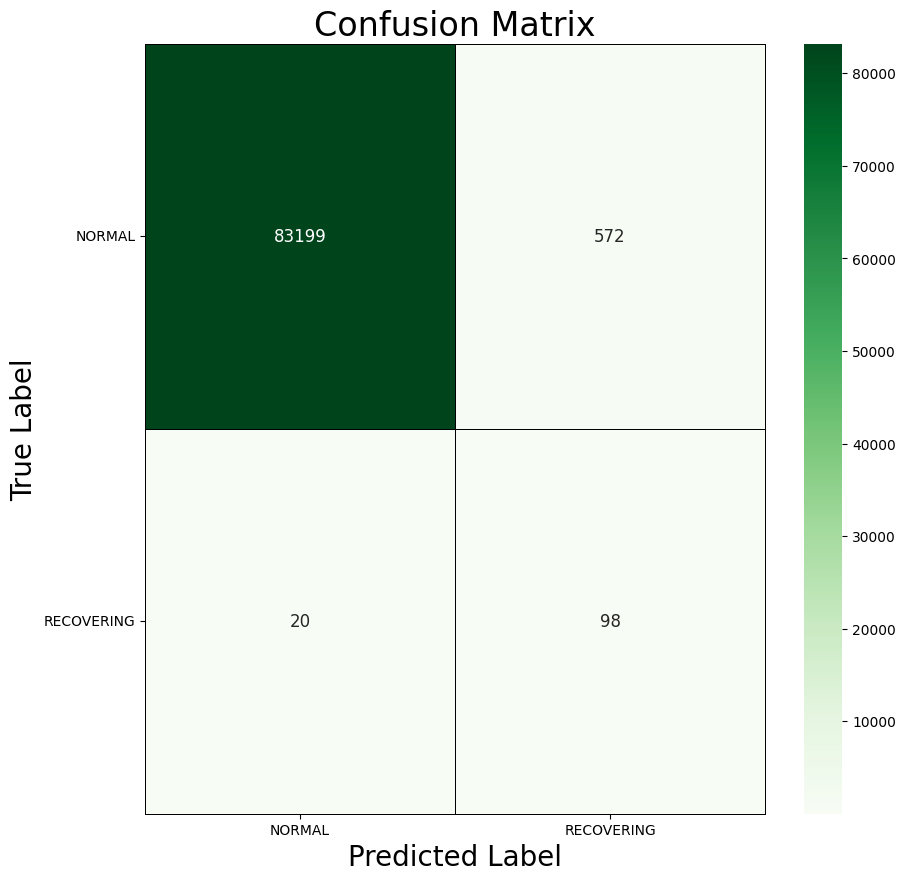

In [38]:
plot_confusion_matrix(
    test_df[target_column], 
    test_preds, 
    figsize=(10, 10),  
    classes=['NORMAL', 'RECOVERING']
)

In [39]:
print(
    classification_report(
        test_df[target_column], 
        test_preds, 
        target_names=['NORMAL', 'RECOVERING']
))

              precision    recall  f1-score   support

      NORMAL       1.00      0.99      1.00     83771
  RECOVERING       0.15      0.83      0.25       118

    accuracy                           0.99     83889
   macro avg       0.57      0.91      0.62     83889
weighted avg       1.00      0.99      1.00     83889



### XGBOOST EVALUATION

In [ ]:

# 1. Get the best parameters from the Optuna study
best_params = xgb_study.best_params
# Ensure the objective and eval_metric are set for the final model
best_params['objective'] = 'binary:logistic'
best_params['eval_metric'] = 'logloss'
best_params['random_state'] = 42

# 2. Initialize and train the final model on the entire training set
final_model = xgb.XGBClassifier(**best_params)

print("Fitting the final model on the entire training dataset...")
final_model.fit(train_df[selected_features], train_df[target_column])
print("Final model training complete.")


Fitting the final model on the entire training dataset...
Final model training complete.



--- Making Predictions on the Test Set ---


--- Final Model Evaluation on the Test Set ---
Model Accuracy on Test Set: 0.9978 (99.78%)
Classification Report:
              precision    recall  f1-score   support

      NORMAL       1.00      1.00      1.00     83771
  RECOVERING       0.36      0.79      0.50       118

    accuracy                           1.00     83889
   macro avg       0.68      0.89      0.75     83889
weighted avg       1.00      1.00      1.00     83889

Confusion Matrix:


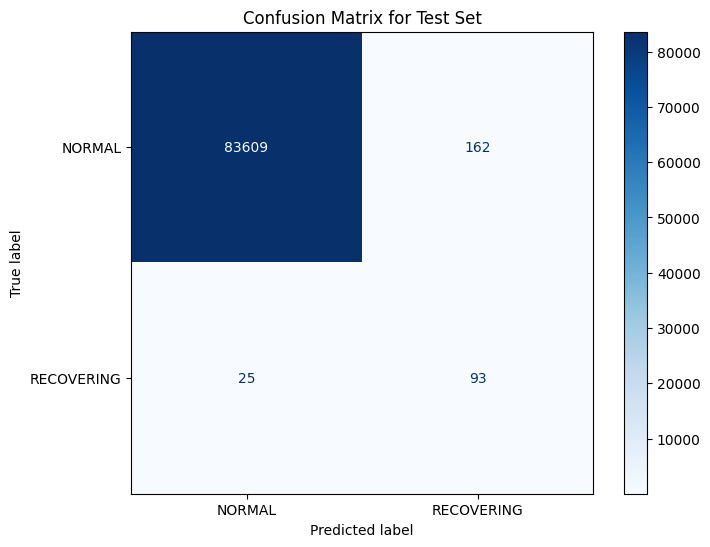



--- Feature Importance Analysis ---


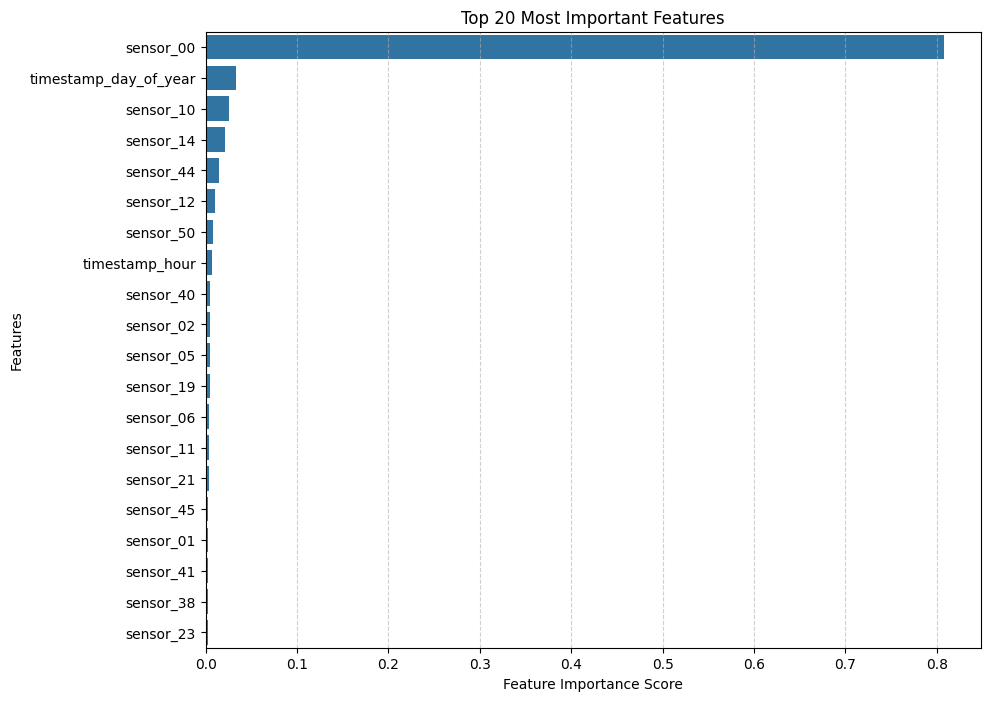

In [62]:
# 3. Make predictions on the unseen test set
print("\n--- Making Predictions on the Test Set ---")
test_predictions = final_model.predict(test_df[selected_features])
test_pred_proba = final_model.predict_proba(test_df[selected_features])[:, 1]


# --- FINAL MODEL EVALUATION ---
print("\n\n--- Final Model Evaluation on the Test Set ---")

# Calculate Accuracy Score
accuracy = accuracy_score(test_df[target_column], test_predictions)
print(f"Model Accuracy on Test Set: {accuracy:.4f} ({accuracy:.2%})")

# 4. Generate and print the classification report
print("Classification Report:")
report = classification_report(
    test_df[target_column], 
    test_predictions, 
    target_names=['NORMAL', 'RECOVERING'],
)
print(report)

# 5. Generate and plot the confusion matrix
print("Confusion Matrix:")
cm = confusion_matrix(test_df[target_column], test_predictions)
disp = ConfusionMatrixDisplay(
    confusion_matrix=cm, 
    display_labels=['NORMAL', 'RECOVERING']
)

fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(ax=ax, cmap='Blues')
plt.title("Confusion Matrix for Test Set")
plt.show()


# --- FEATURE IMPORTANCE ---
print("\n\n--- Feature Importance Analysis ---")

# 6. Get and plot feature importances to understand model decisions
feature_importances = pd.Series(final_model.feature_importances_, index=selected_features)
top_20_features = feature_importances.nlargest(20)

plt.figure(figsize=(10, 8))
sns.barplot(x=top_20_features, y=top_20_features.index)
plt.title("Top 20 Most Important Features")
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.show()